# Рынок заведений общественного питания Москвы

Инвесторы решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
<br /> **Задача проекта:** подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

<font size="4"> Описание данных

Для исследования будет использован датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
<br />«Средний счёт: 1000–1500 ₽»;
<br />«Цена чашки капучино: 130–220 ₽»;
<br />«Цена бокала пива: 400–600 ₽».
<br />и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
<br />Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
<br />Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
<br />Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
<br />Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
<br />Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
<br />Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
<br />0 — заведение не является сетевым
<br />1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Знакомство с данными

In [1]:
import pandas as pd
from plotly import graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
plt.rcParams ['figure.figsize'] = [12, 8]

Загрузим данные о заведениях общественного питания Москвы.

In [2]:
try:
    df = pd.read_csv('C:/datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://drive.google.com/drive/datasets/moscow_places.csv')

Изучим общую информацию о датасете.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датасете представлено 8406 заведений.
В основом столбцы содержат в себе данные типа object (название заведения, категория, адрес, административный район, дни и часы работы, категория цен в заведении,  средняя стоимость заказа в виде диапазона) или float64 (широта, долгота, рейтинг заведения, число с оценкой среднего чека, число с оценкой одной чашки капучино и количество посадочных мест), столбик chain представлен целым числом (int64), т.к. содержит в себе либо 0 (не сетевое заведение), либо 1 (сетевое заведение).

In [4]:
df['name'].nunique()

5614

Из 8406 заведений - 5614 уникальных наименований. Скорее всего на это повлияли сетевые заведения, а также заведения с названием типа "кафе" или "хинкальная".

In [5]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Предобработка данных

### Дубликаты и пропуски в данных

In [6]:
print("Кол-во явных дубликатов:",df.duplicated().sum())

Кол-во явных дубликатов: 0


In [7]:
# приведем столбцы с наименованием и адресом к нижнему регистру
# для поиска неявных дубликатов
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [8]:
# посмотрим есть ли дубликаты в связке {название заведения, адрес}
df.loc[df.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Неявные дубликаты найдены, удалим их.

In [9]:
df.drop_duplicates(subset=['name', 'address'], keep='first', inplace=True)

Теперь посмотрим на пропуски.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


Пропуски встречаются в столбцах: 
- дни и часы работы,
- категория цен в заведении,
- средняя стоимость заказа в виде диапазона,
- число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»,
- число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»,
- количество посадочных мест.

Оставим как есть.

### Дополнительные столбцы

Создадим столбец street с названиями улиц из столбца с адресом.

In [11]:
df['street'] = df['address'].str.split(', ').str[1]

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [12]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

Проверим, верно ли отображаются созданные нами столбцы.

In [13]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


## Анализ данных

### Категории заведений

Посмотрим какие категории заведений представлены в данных:

In [14]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Для визуализации воспользуемся круговой диаграммой.

In [15]:
# готовим данные для графика
df_categories = pd.DataFrame(df['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=df_categories['index'], # указываем значения, которые появятся на метках сегментов
                             values=df_categories['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество объектов общественного питания по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.28, # вручную настраиваем аннотацию легенды
                                    y=1.04,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Преобладающая категория по количеству заведений в Москве: кафе - 2378 точек (28,3%). На втором месте с небольшим отставанием рестораны (2043 точки - 24,3%). На третьем кофейни (1413 точек. - 16,8%).

### Количество посадочных мест

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.

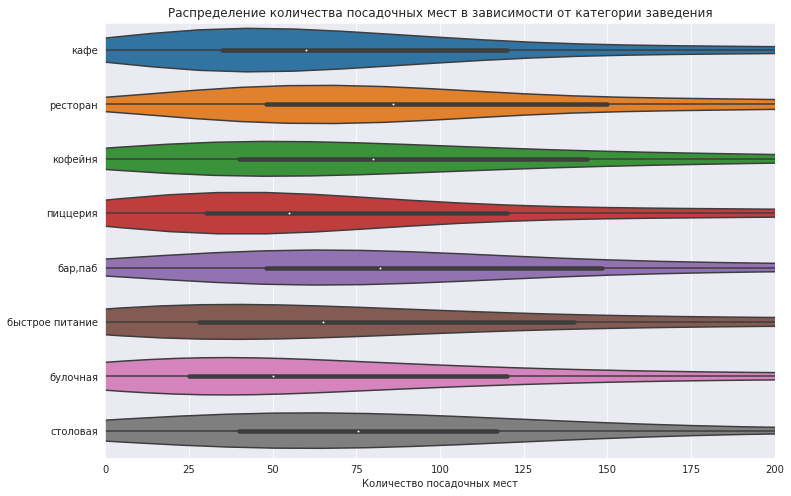

In [16]:
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
# строим график violinplot средствами seaborn
sns.violinplot(x='seats', y='category', data=df)
# ограничиваем ось X для наглядности
plt.xlim(0, 200)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества посадочных мест в зависимости от категории заведения')
plt.xlabel('Количество посадочных мест')
plt.ylabel(None)
# отображаем график на экране
plt.show()

Больше всего посадочных мест предусмотрено в заведениях типа ресторан. Медианное значение показывает, что меньше всего посадочных мест в заведениях типа булочная.

### Сетевые/несетевые заведения

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

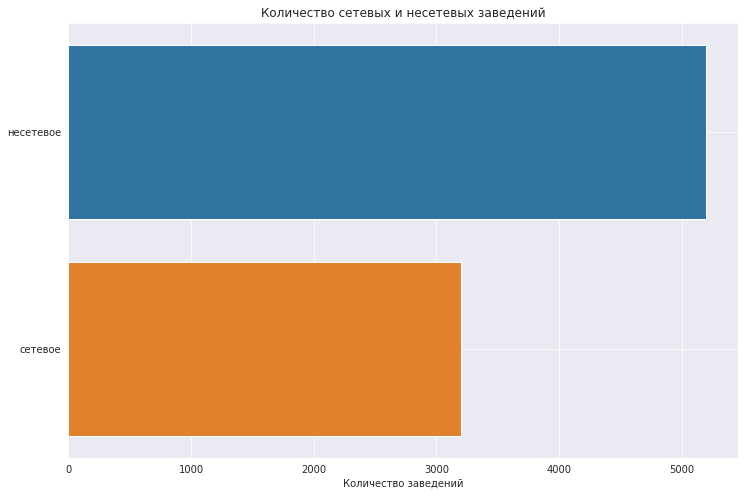

In [17]:
# группируем данные по признаку сетевое/несетевое и считаем количество заведений
df_c = df.groupby(['chain'], as_index = False)[['name']].count()
df_c['chain'] = df_c['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='chain', data=df_c)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество сетевых и несетевых заведений')
plt.xlabel('Количество заведений')
plt.ylabel(None)

# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

На графике видно, что несетевых заведений примерно в 1,5 раза больше, чем сетевых.

### Сетевые/несетевые заведения по категориям

Посмотрим какие категории заведений чаще являются сетевыми. Исследуем данные и ответим на вопрос графиком.

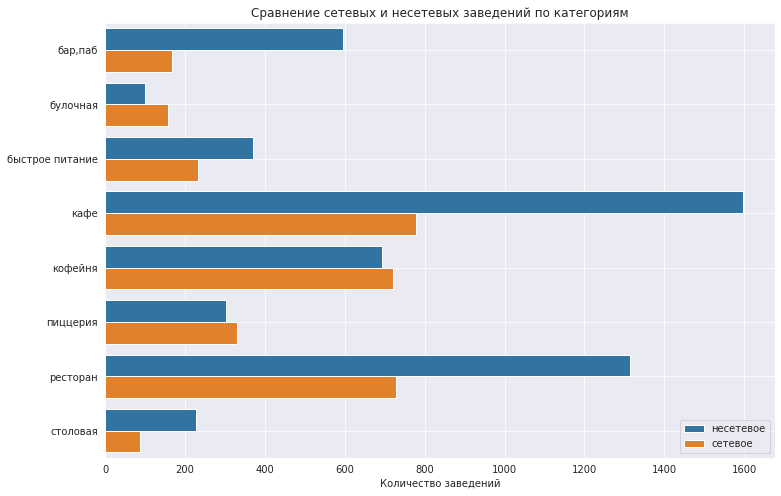

In [18]:
# группируем данные по категориям заведений и признаку сетевое/несетевое и считаем количество заведений
df_cc = df.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count()
df_cc['chain'] = df_cc['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=df_cc, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Сравнение сетевых и несетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel(None)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

При расмотрении отдельных категорий оказалось, что для булочных, кофеен и пиццерий более свойственно быть сетевыми, чем нет, в отличии от других категорий.

### ТОП-15 популярных сетей в Москве

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию.

In [19]:
# сгруппируем данные по названиям заведений и посчитаем их количество
top15_name = df.query('chain == 1').groupby(['name', 'category'])[['name']].count()
# переименуем столбец
top15_name.columns = ['count_places']
# отсортируем и оставим пятнадцать лидеров
top15_name = top15_name.reset_index().sort_values(by='count_places', ascending=False).head(15)
display(top15_name)

,name,category,count_places
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [20]:
# строим столбчатую диаграмму 
fig = px.bar(top15_name.sort_values(by='count_places', ascending=True), # загружаем данные и заново их сортируем
             x='count_places', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count_places' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show() # выводим график

Большинство сетей определенно мне знакомы. Первое место занимает кофейня Шоколадница, далее две пиццерии, снова кофейни и рестораны.

### Административные районы Москвы

Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Попробуем проиллюстрировать эту информацию одним графиком.

In [21]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [22]:
#создадим таблицу с названиями районов и категорий
d_c = df.groupby(['district', 'category'])['name'].count().reset_index()
d_c.columns = ['district', 'category', 'count_places']
d_c.sort_values('count_places', ascending=False)

,district,category,count_places
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [23]:
fig = px.bar(d_c,
             x='count_places',
             y='district',
                                
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title=None,
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

### Средние рейтинги

Визуализируем распределение средних рейтингов по категориям заведений.

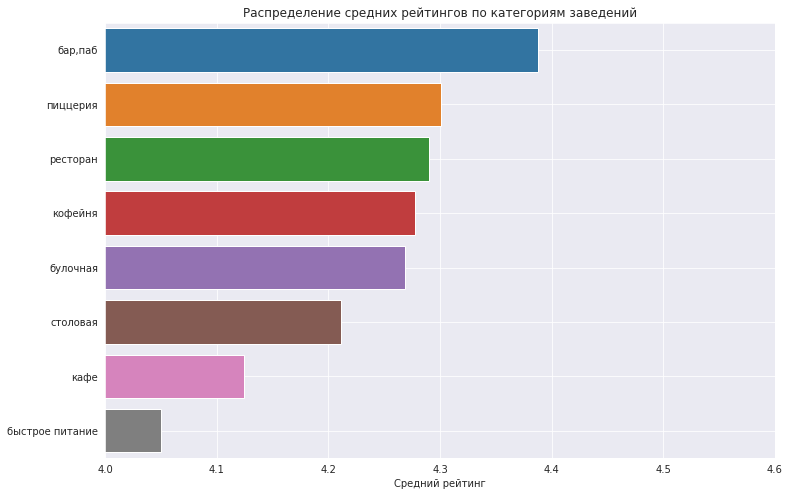

In [24]:
# группируем данные по категориям заведений и считаем средний рейтинг
df_ra = df.groupby(['category'], as_index = False)[['rating']].mean()
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# строим столбчатый график средствами seaborn
sns.barplot(x='rating', y='category', data=df_ra.sort_values(by='rating', ascending=False))
# формируем заголовок графика и подписи осей средствами matplotlib
plt.xlim(4,4.6)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Средний рейтинг')
plt.ylabel(None)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Бары и пабы в среднем имеют рейтинг выше, чем остальные типы заведений, почти 4,4 из 5. Заведения быстрого питания оцениваются ниже остальных - в среднем на 4,05 из 5.

### Хороплет со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [25]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')

In [26]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Все заведения датасета на карте

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [27]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m2

На такой карте наглядно видно распределение заведений по Москве: огромное скопление в центре и все меньшее их количество по мере удаления от центра столицы.

### ТОП-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.

In [28]:
top15_streets = df['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count_places']
top15_streets

,street,count_places
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [29]:
#создадим таблицу с названиями улиц, катеогриями заведений и количеством заведений
s_c = df.groupby(['street', 'category'])['name'].count().reset_index()
s_c.columns = ['street', 'category', 'count_places']
s_c.sort_values('count_places', ascending=False)

,street,category,count_places
2137,проспект мира,кафе,53
1520,мкад,кафе,45
2140,проспект мира,ресторан,45
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
...,...,...,...
1536,молодёжная улица,кофейня,1
1538,монтажная улица,кофейня,1
1539,монтажная улица,ресторан,1
1540,москворецкая набережная,кофейня,1


In [30]:
#оставим в этой таблице улицы из топ-15, остальные удалим
s_c = s_c[s_c['street'].isin(top15_streets['street'])]
s_c

,street,category,count_places
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3174,улица миклухо-маклая,быстрое питание,4
3175,улица миклухо-маклая,кафе,21
3176,улица миклухо-маклая,кофейня,4
3177,улица миклухо-маклая,пиццерия,2


In [31]:
fig = px.bar(s_c,
             x='count_places',
             y='street',
             template='ggplot2',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='ТОП-15 улиц по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title=None,
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

### Улицы, на которых находится только один объект общепита

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [32]:
street_one = df['street'].value_counts().reset_index()
street_one.columns = ['street', 'count_places']
street_one = street_one.query('count_places == 1')
street_one['street'].count()

457

458 улиц Москвы, на которых располагается всего 1 заведение общепита.

In [33]:
s_o = df.groupby(['street', 'category'])['name'].count().reset_index()
s_o.columns = ['street', 'category', 'count_places']
s_o = s_o[s_o['street'].isin(street_one['street'])]
s_o.head(10)

,street,category,count_places
0,1-й автозаводский проезд,кафе,1
1,1-й балтийский переулок,ресторан,1
2,1-й варшавский проезд,кафе,1
3,1-й вешняковский проезд,кафе,1
7,1-й голутвинский переулок,"бар,паб",1
8,1-й грайвороновский проезд,"бар,паб",1
9,1-й дербеневский переулок,кафе,1
12,1-й земельный переулок,ресторан,1
13,1-й капотнинский проезд,кафе,1
14,1-й кирпичный переулок,кафе,1


In [34]:
s_o['category'].unique()

array(['кафе', 'ресторан', 'бар,паб', 'кофейня', 'столовая', 'булочная',
       'пиццерия', 'быстрое питание'], dtype=object)

In [35]:
s_o.groupby('category')['street'].count()

category
бар,паб             39
булочная             8
быстрое питание     23
кафе               159
кофейня             84
пиццерия            15
ресторан            93
столовая            36
Name: street, dtype: int64

Заведение любой категории имеет шанс оказаться единственным на улице, но в реальности кафе оказываются лидерами в данном вопросе.

### Средний чек по районам

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района.

In [36]:
avg_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avg_bill_df.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Используем это значение в качестве ценового индикатора района и построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [37]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m3)

# выводим карту
m3

Цены в центральном и западном административных округах наиболее высокие. Определенно, удалённость от центра влияет на цены в заведениях. Чем дальше от центра - тем меньше будет средний чек в среднем заведении. Сетевых точек это обычно не касается.

### Общий вывод

- Преобладающая категория по количеству заведений в Москве: кафе - 2378 точек (28,3%). На втором месте с небольшим отставанием рестораны (2043 точки - 24,3%). На третьем кофейни (1413 точек. - 16,8%);
- Больше всего посадочных мест предусмотрено в заведениях типа ресторан. Медианное значение показывает, что меньше всего посадочных мест в заведениях типа булочная;
- Несетевых заведений в Москве примерно в 1,5 раза больше, чем сетевых. Но при этом для булочных, кофеен и пиццерий ситуация обратная - сетевых заведений больше, чем несетевых;
- Самая популярная сеть питания столицы - кофейня Шоколадница (119 точек), далее две пиццерии Домино'с Пицца (76 точек) и Додо Пицца (74 точки);
- Больше всего заведений сосредоточено в Центральном административном округе;
- Бары и пабы в среднем имеют рейтинг выше, чем остальные типы заведений, почти 4,4 из 5. Заведения быстрого питания оцениваются ниже остальных - в среднем на 4,05 из 5;
- Средний рейтинг заведений в Центральном административном округе выше, чем в остальных;
- Самое больше количество заведений сосредоточено на проспекте Мира, далее идут Профсоюзная улица, проспект Вернандского, Ленинский проспект и т.д.;
- Если на определенной улице находится только один объект общепита - скорее всего это кафе;
- Цены в центральном и западном административных округах наиболее высокие. Определенно, удалённость от центра влияет на цены в заведениях. Чем дальше от центра - тем меньше будет средний чек в среднем заведении. Сетевых точек это обычно не касается.

## Детализируем исследование: открытие кофейни

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [38]:
df.query('category == "кофейня"')['name'].count()

1413

Всего в датасете 1413 кофеен.

In [39]:
# оставим только категорию типа кофейня и сгруппируем данные по районам
coffee_shops = df.query('category == "кофейня"').groupby(['district'])[['name']].count()
# переименуем столбец
coffee_shops.columns = ['count_places']
# отсортируем по количеству заведений
coffee_shops = coffee_shops.reset_index().sort_values(by='count_places', ascending=False)
display(coffee_shops)

,district,count_places
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [40]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=coffee_shops['district'], # указываем значения, которые появятся на метках сегментов
                             values=coffee_shops['count_places'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество кофеен в Москве по районам', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.28, # вручную настраиваем аннотацию легенды
                                    y=1.04,
                                    text='Районы',
                                    showarrow=False)])
fig.show() # выводим график

Треть всех кофеен Москвы располагается в Центральном административном округе.

In [41]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой кофейне датафрейма
df.query('category == "кофейня"').apply(create_clusters, axis=1)

# выводим карту
m4

In [42]:
df_24_7 = df.query('category == "кофейня" and is_24_7 == True')
df_24_7['name'].count()

59

In [43]:
df_24_7.groupby('district')['name'].count()

district
Восточный административный округ            5
Западный административный округ             9
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Центральный административный округ         26
Юго-Восточный административный округ        1
Юго-Западный административный округ         7
Южный административный округ                1
Name: name, dtype: int64

59 кофеен в Москве работают круглосуточно. Скорее всего это кофейни в местах круглосуточного нахождения людей, например, вокзалы. Половина из них находится в Центральном административном округе. 

In [44]:
rating_coffee_shops = df.query('category == "кофейня"').groupby('district', as_index=False)['rating'].agg('mean')
rating_coffee_shops.sort_values(by='rating', ascending=False).round(2)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Разброс среднего рейтинга не слишком большой: от Центрального административного округа со средним значением 4,34 из 5 - до Западного административного округа со средним значением 4,20 из 5.

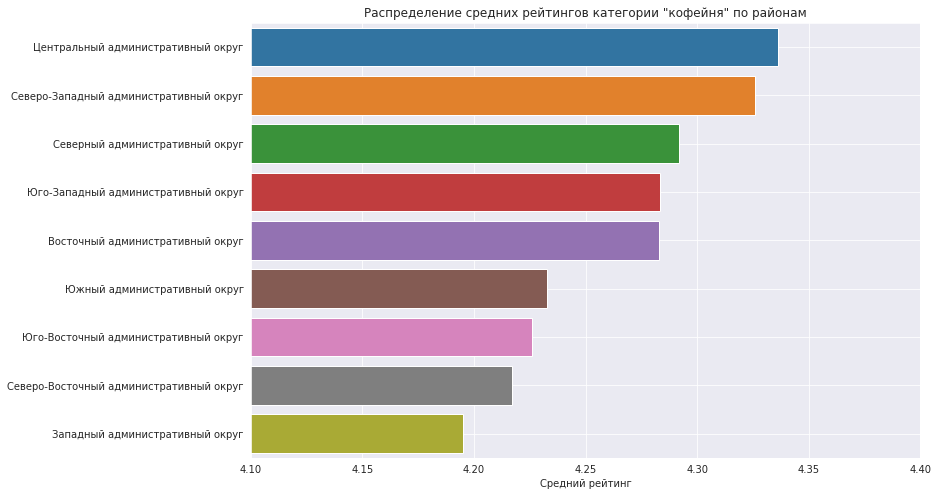

In [45]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# строим столбчатый график средствами seaborn
sns.barplot(x='rating', y='district', data=rating_coffee_shops.sort_values(by='rating', ascending=False))
# формируем заголовок графика и подписи осей средствами matplotlib
plt.xlim(4.1,4.4)
plt.title('Распределение средних рейтингов категории "кофейня" по районам')
plt.xlabel('Средний рейтинг')
plt.ylabel(None)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [46]:
avg_coffee_cup = df.query('category == "кофейня"').groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
avg_coffee_cup.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [47]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино',
).add_to(m5)

# выводим карту
m5

При определении стоимости чашки капучино следует в том числе ориентироваться на среднюю стоимость чашки капучино в районе.
Так, например, в Юго-Западном административном округе оказался самый дорогой кофе (в среднем 198 руб. за чашку), а в Восточном административном округе самый дешевый (в среднем 135 руб. за чашку).

<font size="4"> Рекомендация

Стоит присмотреться к Западному и Юго-Западному административным округам. Преимущества:
- Средняя стоимость чашки капучино выше, чем в других районах Москвы - можно установить соответствующие цены в своем заведении;
- При этом в Западном районе сосредоточено 10,6% (150 точек) всех кофеен Москвы, в Юго-Западном 6,79% (96 точек);
- В Западном административном округе рейтинг ниже, чем в других районах - больше возможностей выделиться.

## Презентация

Презентация: <https://drive.google.com/file/d/1hHcUSZkN0CP4HButWfW1_XmtIXCCw_iF/view?usp=sharing> 